In [4]:
import pandas as pd
#import plotly.graph_objects as go
#import plotly.express as px
#from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.dates as mdates
from math import ceil

In [7]:
world_df = pd.read_csv('./data/world.csv')
world_df.date = pd.to_datetime(world_df.date, yearfirst = True, format = '%Y-%m-%d')
world_df.date = world_df.date.dt.strftime('%m/%d/%Y')
world_df.sort_values('date',inplace=True)
world_df.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cvd_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
6353,DOM,North America,Dominican Republic,01/01/2020,0.0,0.0,0.0,0.0,0.0,0.0,...,4.419,14600.861,1.6,266.653,8.20,8.5,19.1,55.182,1.60,74.08
7640,FIN,Europe,Finland,01/01/2020,0.0,0.0,0.0,0.0,0.0,0.0,...,13.264,40585.721,NaN,153.507,5.76,18.3,22.6,NaN,3.28,81.91
13760,MYS,Asia,Malaysia,01/01/2020,0.0,0.0,0.0,0.0,0.0,0.0,...,3.407,26808.164,0.1,260.942,16.74,1.0,42.4,NaN,1.90,76.16
10154,IND,Asia,India,01/01/2020,0.0,0.0,0.0,0.0,0.0,0.0,...,3.414,6426.674,21.2,282.280,10.39,1.9,20.6,59.550,0.53,69.66
21123,SWE,Europe,Sweden,01/01/2020,0.0,0.0,0.0,0.0,0.0,0.0,...,13.433,46949.283,0.5,133.982,4.79,18.8,18.9,NaN,2.22,82.80


In [151]:
def plot_individual_country(country, df = world_df):
    fig,ax = plt.subplots(figsize = (20,10))
    ax2 = ax.twinx()
    tmp = df[df.location==country].copy()
    ax.plot(tmp.date,tmp.new_cases.rolling(7).mean()/tmp.new_tests_smoothed, lw = 3, c = '#aaaaaa', marker = 'o', markeredgecolor = 'k', markerfacecolor = '#00ffff', ms = 10)
    ax.set_ylim([0,0.5])
    ax2.bar(tmp.date,tmp.new_tests_smoothed_per_thousand, color = '#FFC900', edgecolor = 'k')
    ax2.set_title(country, fontsize = 24)
    ax2.xaxis.set_major_locator(mdates.DayLocator(interval = 10))
    ax2.tick_params(axis = 'y', direction = 'in', labelsize = 16)
    ax.set_zorder(1)
    ax.patch.set_visible(False)
    ax.xaxis.set_major_locator(mdates.DayLocator(interval = 30))
    ax.set_yticks([0,0.1,0.2,0.3,0.4,0.5])
    ax.set_yticklabels(['0%','10%','20%','30%','40%','50%'])
    ax.tick_params(axis = 'both', direction = 'in', labelsize = 16)
    
    fig.text(-0.02,0.5, '% Positive Tests', rotation = 90, fontsize = 24)
    fig.text(1.02,0.5, 'Tests per 1000', rotation = 270, fontsize = 24)
    plt.show()

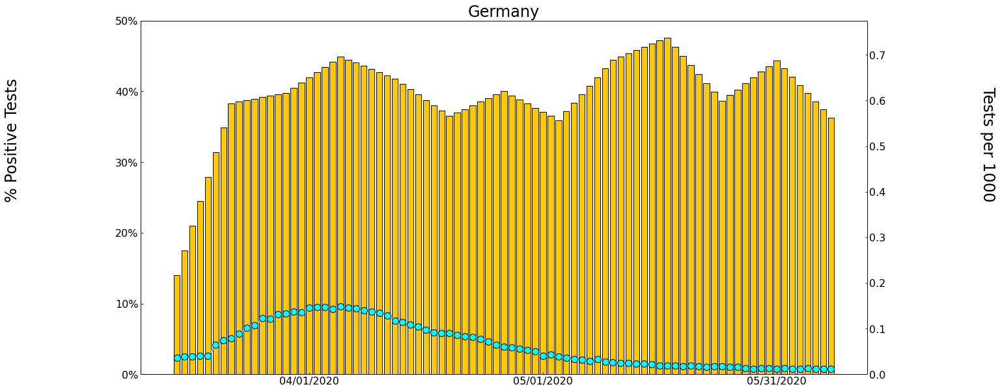

In [159]:
plot_individual_country('Germany')

In [128]:
countries = sorted(world_df.location.unique())
fig,ax = plt.subplots(29,3,figsize = (40,300))
ax = ax.flatten()
count = 0
for country in countries:
    tmp = world_df[world_df.location==country].copy()
    if tmp.new_tests_smoothed.dropna().shape[0]!=0:
        ax2 = ax[count].twinx()
        ax[count].plot(tmp.date,tmp.new_cases.rolling(7).mean()/tmp.new_tests_smoothed, lw = 3, c = '#aaaaaa', marker = 'o', markeredgecolor = 'k', markerfacecolor = '#00ffff')
        ax[count].set_ylim([0,0.5])
        ax2.bar(tmp.date,tmp.new_tests_smoothed_per_thousand, color = '#FFC900', edgecolor = 'k')
        ax2.set_title(country, fontsize = 24)
        ax2.xaxis.set_major_locator(mdates.DayLocator(interval = 10))
        count += 1
        ax2.tick_params(axis = 'y', direction = 'in', labelsize = 16)
        ax[count].set_zorder(1)
        ax[count].patch.set_visible(False)
for a in ax:
    a.xaxis.set_major_locator(mdates.DayLocator(interval = 10))
    a.set_yticks([0,0.1,0.2,0.3])
    a.set_yticklabels(['0%','10%','20%','30%'])
    a.tick_params(axis = 'both', direction = 'in', labelsize = 16)
    
fig.text(-0.02,0.5, '% Positive Tests', rotation = 90, fontsize = 24)
fig.text(1.02,0.5, 'Tests per 1000', rotation = 270, fontsize = 24)
plt.tight_layout()
plt.show()

In [10]:
world_df.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'total_deaths', 'new_deaths', 'total_cases_per_million',
       'new_cases_per_million', 'total_deaths_per_million',
       'new_deaths_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'tests_units',
       'stringency_index', 'population', 'population_density', 'median_age',
       'aged_65_older', 'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cvd_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy'],
      dtype='object')

In [27]:
us_df = pd.read_csv('./data/US.csv')
us_df.date = pd.to_datetime(us_df.date, yearfirst = True, format = '%Y%m%d')
us_df.date = us_df.date.dt.strftime('%m/%d')
us_df.sort_values('date',inplace=True)
us_df.head()

,date,states,positive,negative,pending,hospitalizedCurrently,hospitalizedCumulative,inIcuCurrently,inIcuCumulative,onVentilatorCurrently,...,lastModified,total,totalTestResults,posNeg,deathIncrease,hospitalizedIncrease,negativeIncrease,positiveIncrease,totalTestResultsIncrease,hash
147,01/22,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2020-01-22T00:00:00Z,1,1,1,0,0,0,0,0,615132d06fd9e22bc21b1b3ec47fb9b2a0de0734
146,01/23,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2020-01-23T00:00:00Z,1,1,1,0,0,0,0,0,680d664781c7080c1171f160145dafc31e3b93af
145,01/24,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2020-01-24T00:00:00Z,1,1,1,0,0,0,0,0,738e6d4a52f6d0895318ad9eda0d965d09feeb70
144,01/25,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2020-01-25T00:00:00Z,1,1,1,0,0,0,0,0,ca2013db2fa6a2b1a2c776b85d5fcd5e1ca64722
143,01/26,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2020-01-26T00:00:00Z,1,1,1,0,0,0,0,0,defee0e146ae049c86c14a5e580c6219add8e92f


In [55]:
state_df = pd.read_csv('./data/states.csv')
state_df.date = pd.to_datetime(state_df.date, yearfirst = True, format = '%Y%m%d')
state_df.date = state_df.date.dt.strftime('%m/%d')
state_df.sort_values('date',inplace=True)
state_df.head()

,date,state,positive,negative,pending,hospitalizedCurrently,hospitalizedCumulative,inIcuCurrently,inIcuCumulative,onVentilatorCurrently,...,posNeg,deathIncrease,hospitalizedIncrease,hash,commercialScore,negativeRegularScore,negativeScore,positiveScore,score,grade
5784,01/22,WA,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,0,0,2d109d8ba4c74e86fa7202b7c9f26c7617945c58,0,0,0,0,0,NaN
5783,01/23,WA,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,0,0,7ed011fe93129bbc13213e7028e7e1e299d67691,0,0,0,0,0,NaN
5782,01/24,WA,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,0,0,488430e6f0d933476ca2120fe0ee2ecf4aac5b94,0,0,0,0,0,NaN
5781,01/25,WA,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,0,0,4a8a13ff65ef1f0bb991324d98609c765c5b5849,0,0,0,0,0,NaN
5780,01/26,WA,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1,0,0,5372bd69fec11b6097c548b149e4e79fca8d21d2,0,0,0,0,0,NaN


In [56]:
population_dict = {}
with open('./data/populations.tsv','r') as f:
    for line in f:
        line = line.strip().split('\t')
        population_dict[line[0]] = int(line[1])

In [117]:
def plot_individual_state(state, output_file = None, rollingwindow = 7, df = state_df, pop_dict = population_dict):
    fig,ax = plt.subplots(figsize = (20,10))
    ax2 = ax.twinx()
    state_pop = pop_dict[state]

    tmp = df.loc[df.state==state,:].copy()
    tmp.loc[:,'deltapos'] = tmp['positive'].diff()
    tmp.loc[:,'deltapos.rolling'] = tmp['deltapos'].rolling(rollingwindow).mean()
    tmp.loc[:,'deltatest'] = tmp['totalTestResults'].diff()
    tmp.loc[:,'deltatest.rolling'] = tmp['deltatest'].rolling(rollingwindow).mean()
    rate = tmp['deltapos.rolling']/tmp['deltatest.rolling']
    ax.plot(tmp.date, rate , lw = 2, color = '#aaaaaa',zorder = 1)
    ax.scatter(tmp.date, rate , color = ['#00ffff' if x<0.05 else '#ff2300' for x in rate], s = 40, zorder = 3, edgecolor = 'k')
    ax.set_ylim([0,0.3])
    ax2.bar(tmp.date,tmp['deltapos.rolling']/state_pop*1000,color = 'k',zorder = 3)
    ax2.bar(tmp.date,tmp['deltatest.rolling']/state_pop*1000, color = '#FFC900', edgecolor = 'k')

    ax2.tick_params(axis = 'y', direction = 'in', labelsize = 16)
    ax.set_title(state, fontsize = 24)
    ax2.set_ylim([0,4])
    ax.xaxis.set_major_locator(mdates.DayLocator(interval = 10))
    ax.set_yticks([0,0.1,0.2,0.3,0.3])
    ax.set_yticklabels(['0%','10%','20%','30%'])
    ax.tick_params(axis = 'both', direction = 'in', labelsize = 16)

    ax.set_zorder(1)
    ax.patch.set_visible(False)
    if output_file:
        plt.savefig(output_file)
    plt.show()

In [123]:
def plot_multiple_states(states, output_file = None, rollingwindow = 7, df = state_df, pop_dict = population_dict):
    num_states = len(states)
    num_rows = ceil(num_states/3)
    fig,ax = plt.subplots(num_rows,3,figsize = (40,7*num_rows))
    ax = ax.flatten()
    
    states = sorted(states)
    for i,state in enumerate(states):
        ax2 = ax[i].twinx()
        state_pop = population_dict[state]

        tmp = df.loc[df.state==state,:].copy()
        tmp.loc[:,'deltapos'] = tmp['positive'].diff()
        tmp.loc[:,'deltapos.rolling'] = tmp['deltapos'].rolling(7).mean()
        tmp.loc[:,'deltatest'] = tmp['totalTestResults'].diff()
        tmp.loc[:,'deltatest.rolling'] = tmp['deltatest'].rolling(7).mean()
        rate = tmp['deltapos.rolling']/tmp['deltatest.rolling']
        ax[i].plot(tmp.date, rate , lw = 2, color = 'k',zorder = 1)
        ax[i].scatter(tmp.date, rate , color = ['#00ffff' if x<0.05 else '#ff2300' for x in rate], s = 40, zorder = 3, edgecolor = 'k')
        ax[i].set_ylim([0,0.3])
        ax2.bar(tmp.date,tmp['deltapos.rolling']/state_pop*1000,color = 'k',zorder = 3)
        ax2.bar(tmp.date,tmp['deltatest.rolling']/state_pop*1000, color = '#FFC900', edgecolor = 'k')
        (ymin,ymax) = ax2.get_ylim()
        ax2.set_ylim([0,ymax])
        ax2.tick_params(axis = 'y', direction = 'in', labelsize = 16)
        ax[i].set_title(state, fontsize = 24)
        ax[i].set_zorder(1)
        ax[i].patch.set_visible(False)
    for a in ax:
        a.xaxis.set_major_locator(mdates.DayLocator(interval = 10))
        a.set_yticks([0,0.1,0.2,0.3])
        a.set_yticklabels(['0%','10%','20%','30%'])
        a.tick_params(axis = 'both', direction = 'in', labelsize = 16)
    
    fig.text(-0.02,0.5, '% Positive Tests', rotation = 90, fontsize = 24)
    fig.text(1.02,0.5, 'Tests/Cases per 1000', rotation = 270, fontsize = 24)
    plt.tight_layout()
    if output_file:
        plt.savefig(output_file)
    plt.show()

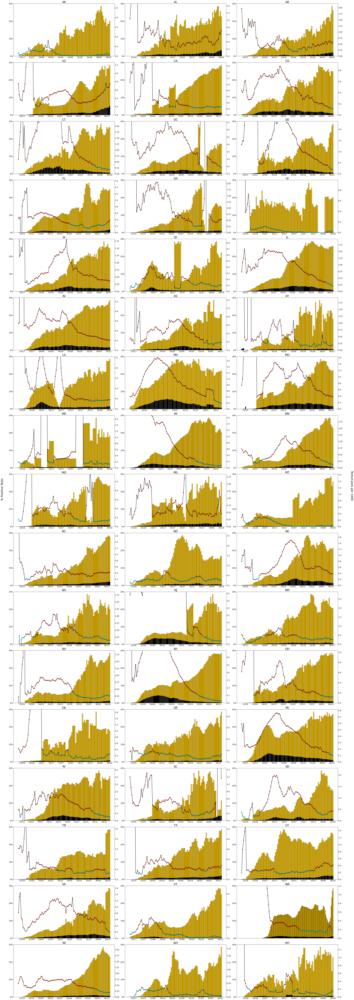

In [124]:
states_dc = [x for x in state_df.state.unique() if x not in ['PR','GU','AS','MP','VI']]
plot_multiple_states(states_dc, output_file = 'AllStates.png')

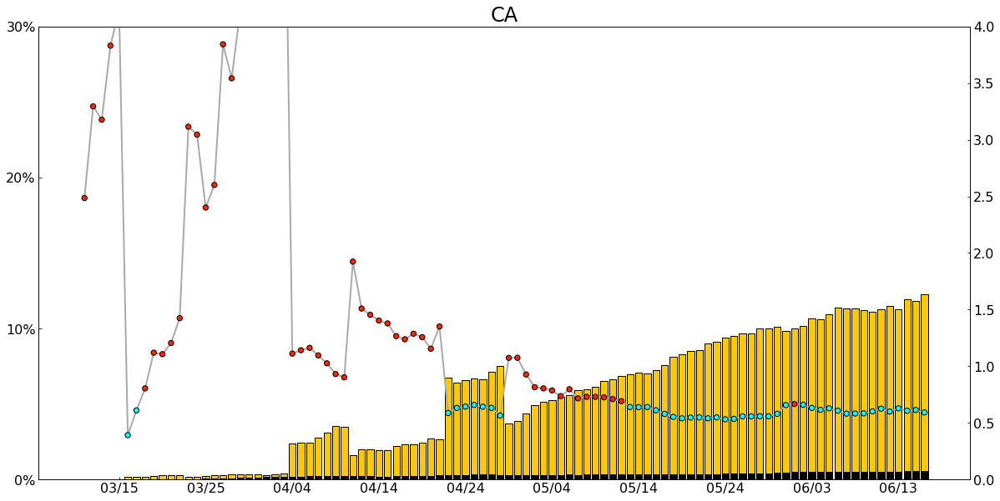

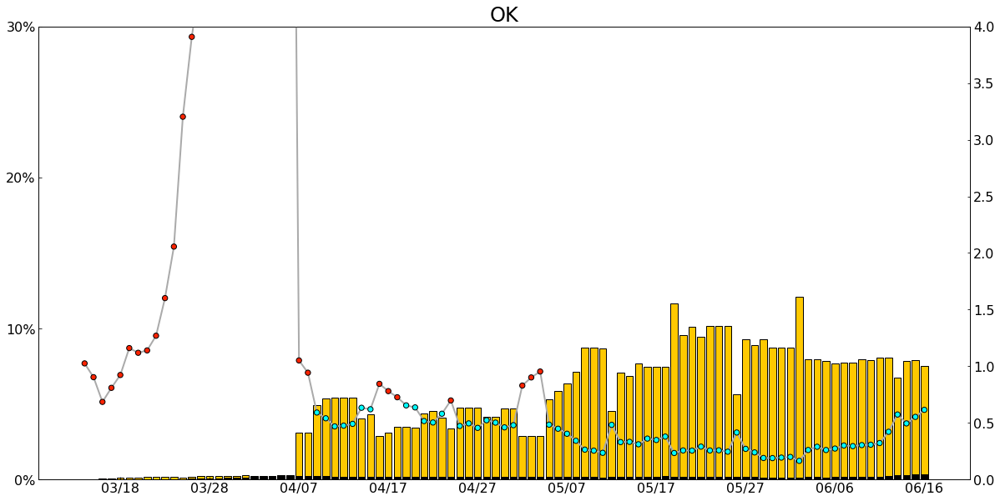

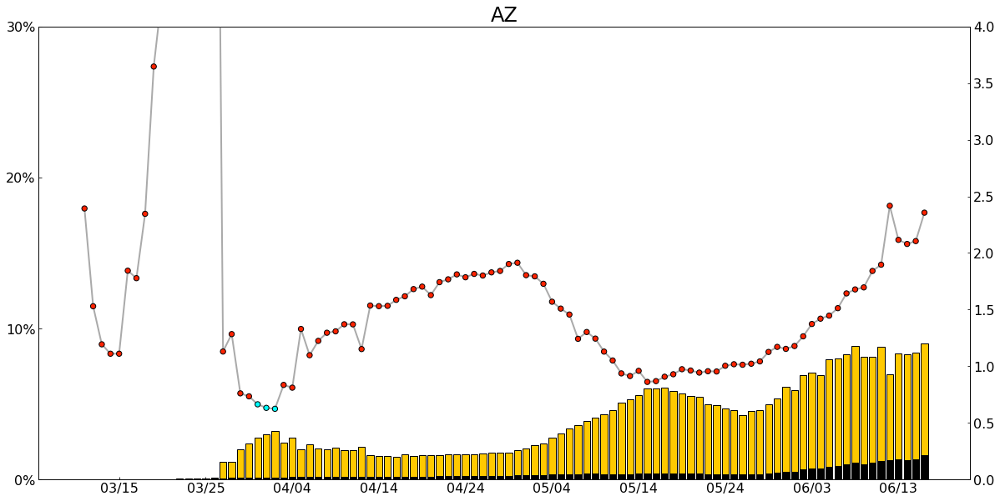

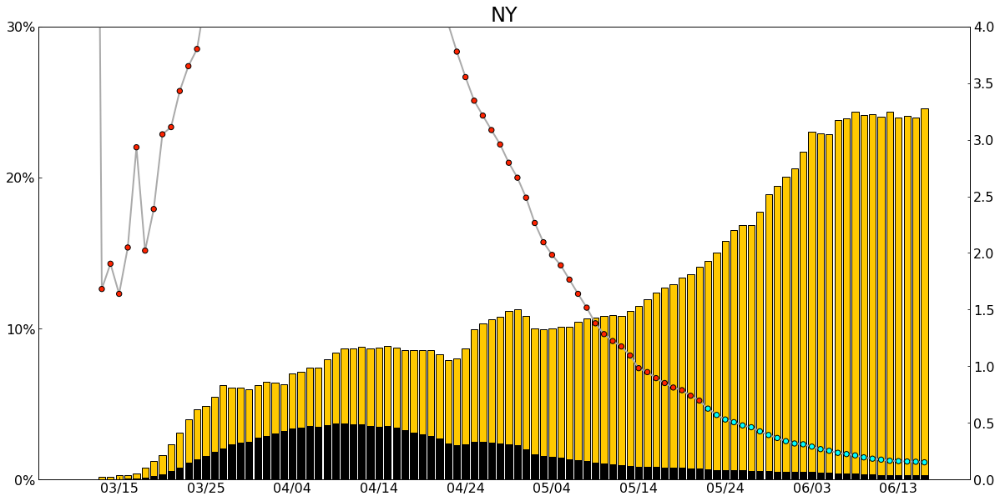

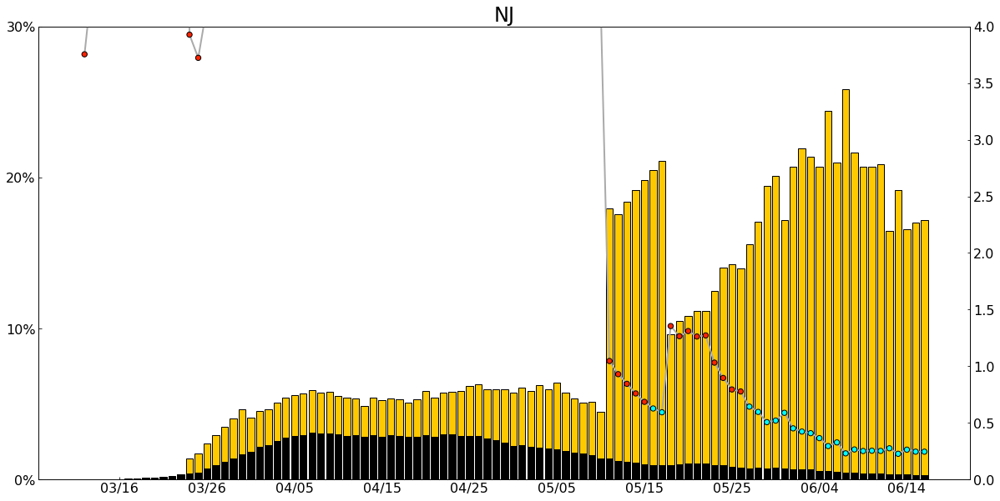

...

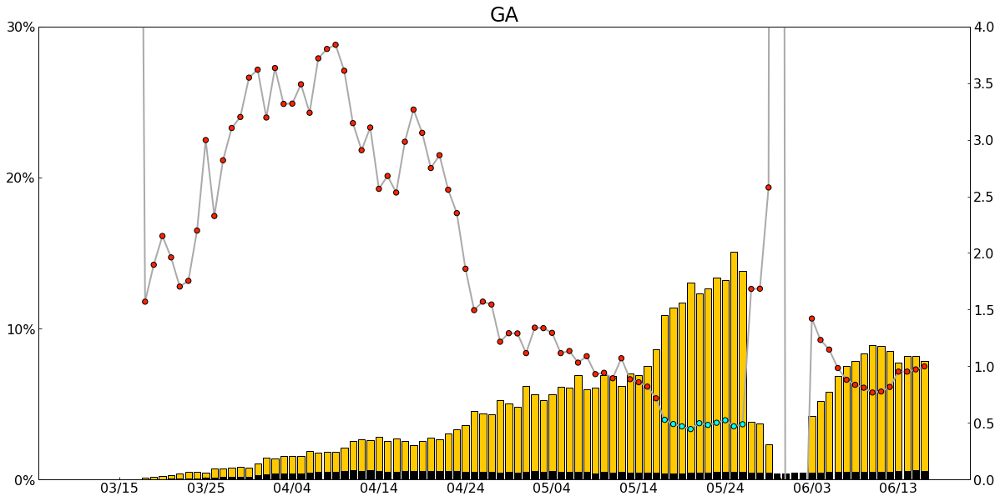

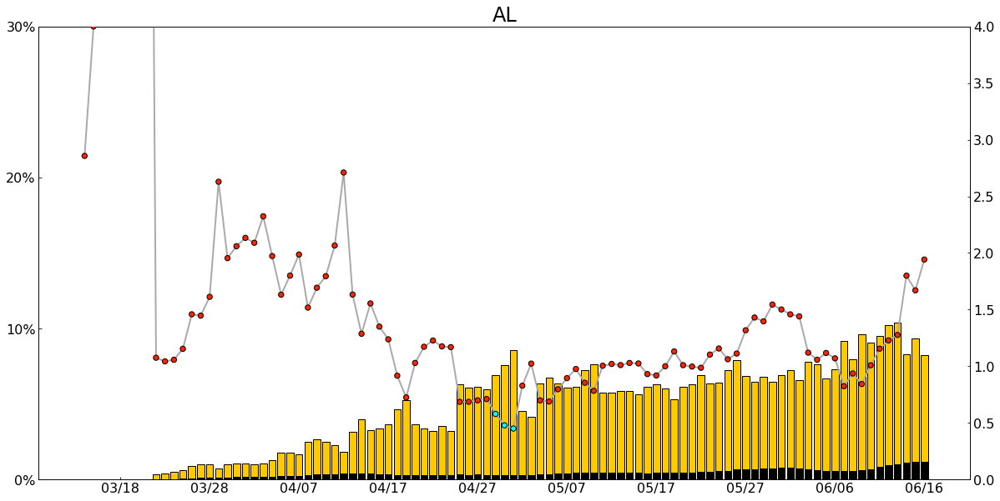

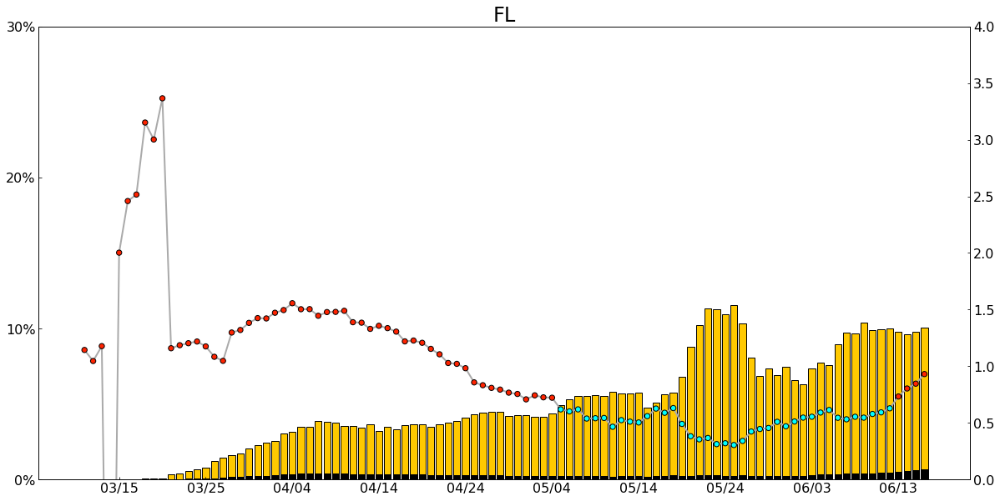

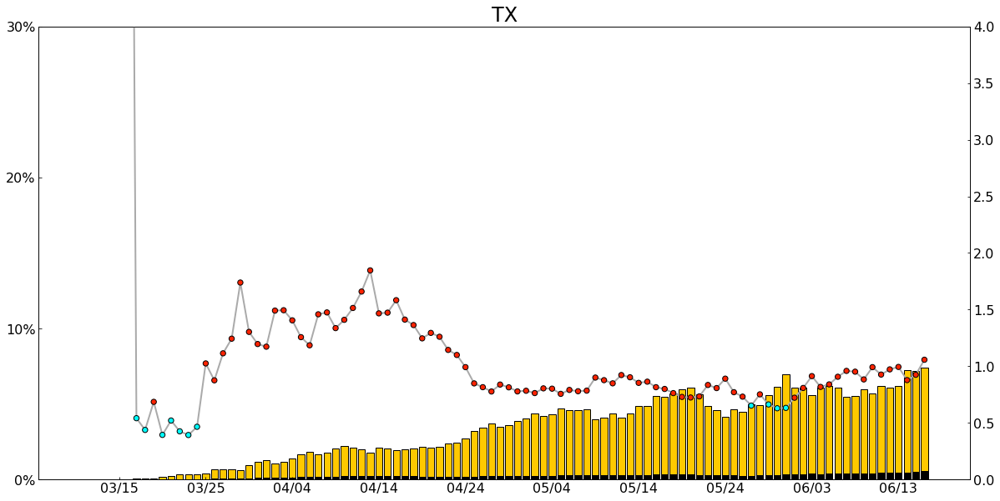

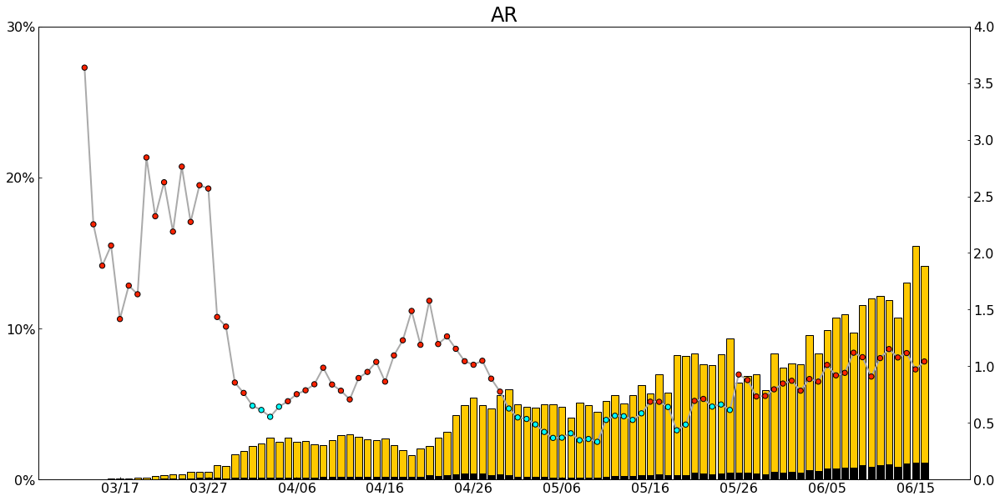

In [121]:
for state in ['CA','OK','AZ','NY','NJ','SC','GA','AL','FL','TX','AR']:
    plot_individual_state(state, output_file = './plots/{}.png'.format(state))

# Plotly old code, maybe revisit for interactive plots

In [59]:
fig = make_subplots()
fig.add_trace(go.Scatter(x = df.date, y = df['deltapos.rolling']/df['deltatest.rolling']))
fig.write_html('first_figure.html', auto_open=True)

/home/hoooman/covid_plots/venv/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/hoooman/covid_plots/venv/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/hoooman/covid_plots/venv/lib/python3.6/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in

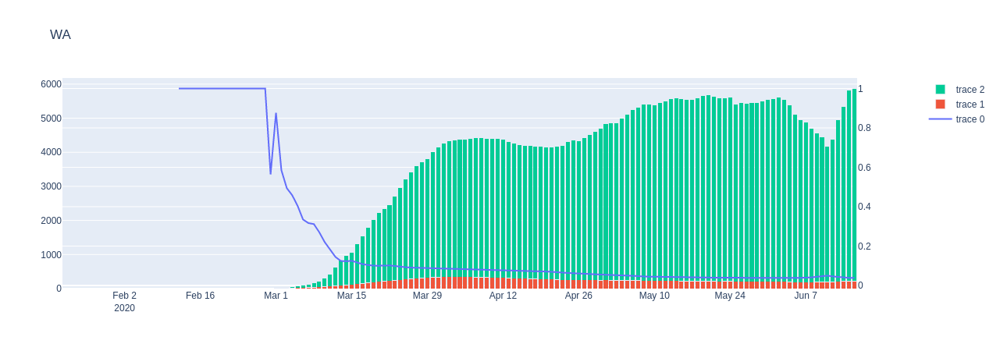

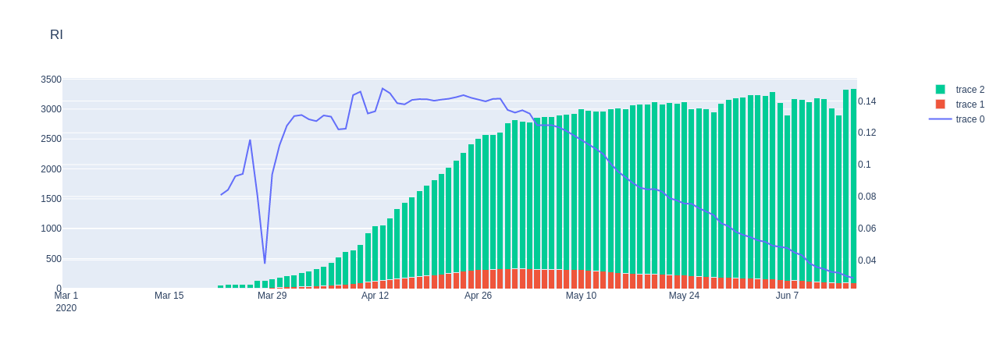

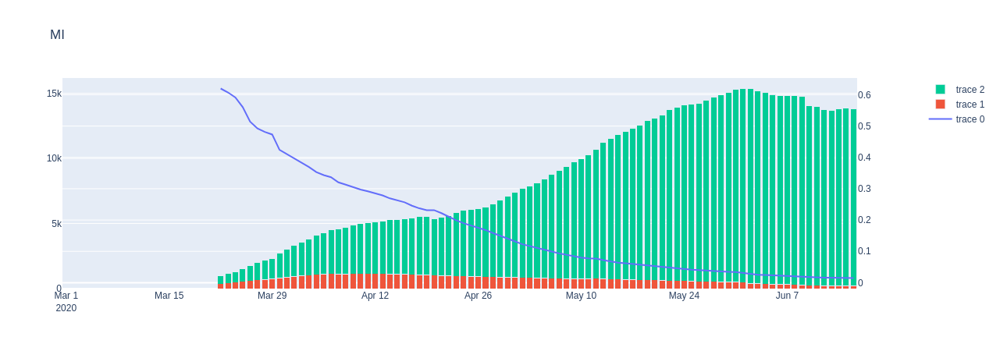

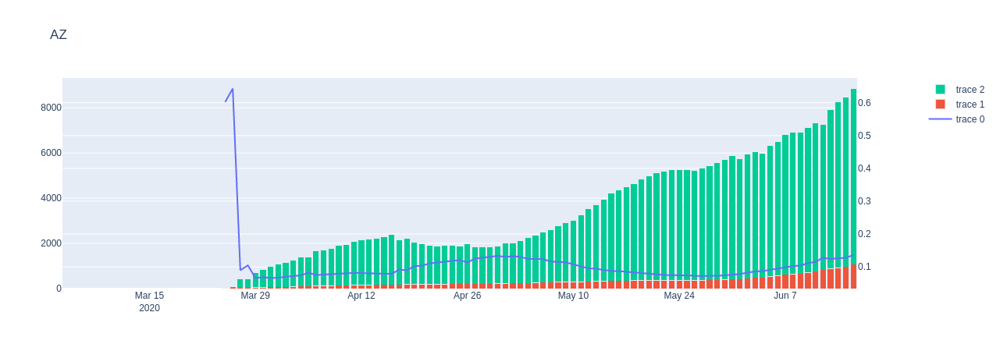

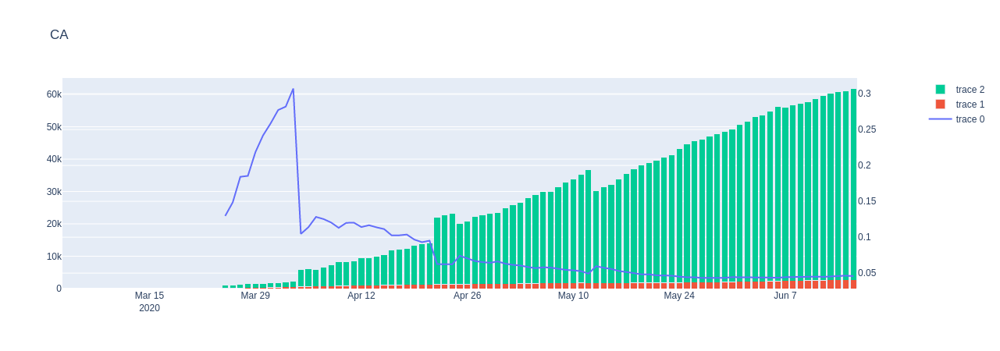

...

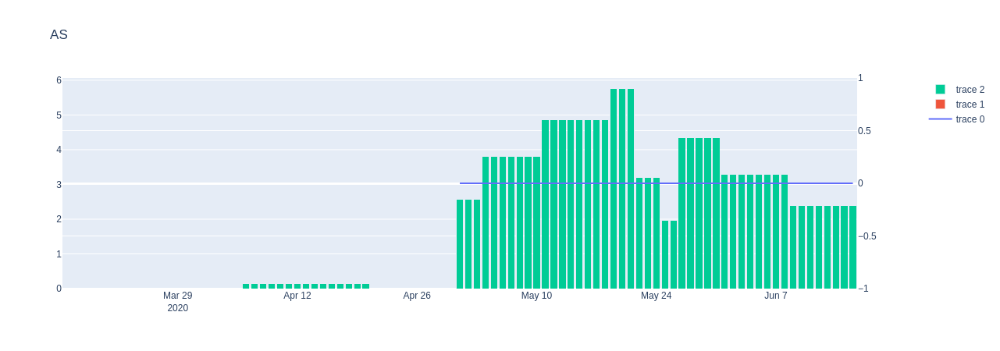

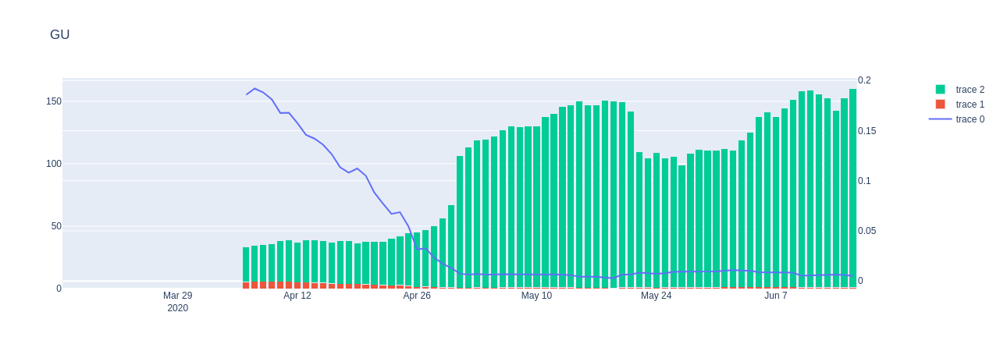

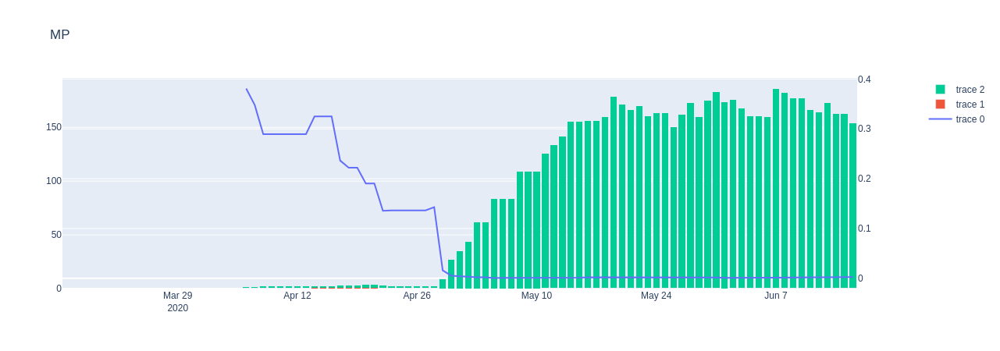

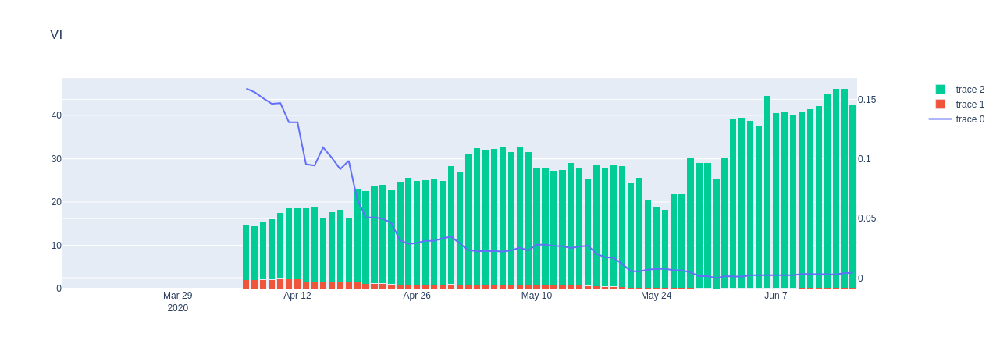

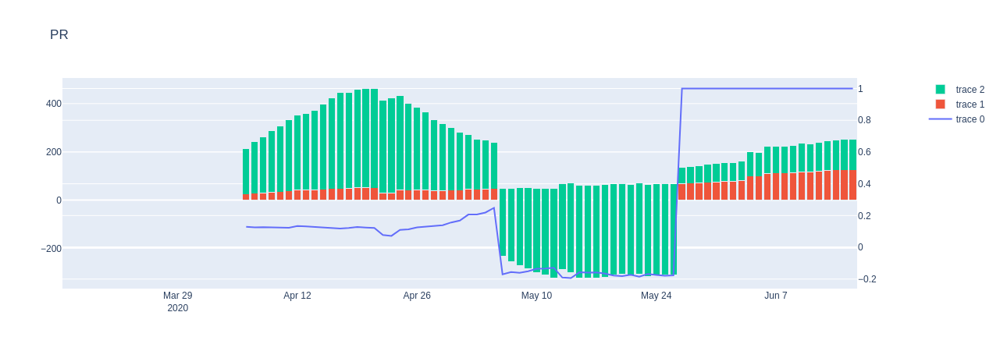

In [99]:
fig = make_subplots(specs = [[{"secondary_y": True}]])

for state in df.state.unique():
    
    if state in df.state.unique():
        tmp = df[df.state==state]
        tmp['deltapos'] = tmp.positive.diff()
        tmp['deltapos.rolling'] = tmp.deltapos.rolling(21).mean()
        tmp['deltatest'] = tmp.totalTestResults.diff()
        tmp['deltatest.rolling'] = tmp.deltatest.rolling(21).mean()
        fig.add_trace(
            go.Scatter(x = tmp.date, y = tmp['deltapos.rolling']/tmp['deltatest.rolling']),
            secondary_y = True
            )
        fig.add_trace(
            go.Bar(x = tmp.date, y = tmp['deltapos.rolling']),
            secondary_y = False
            )
        fig.add_trace(
            go.Bar(x = tmp.date, y = tmp['deltatest.rolling']),
            secondary_y = False
            )
#fig.update_yaxes(type="log")
        fig.update_layout(title = state,barmode = 'stack',
        #    autosize=False,
        #    width=1000,
        #    height=1000
        )
        fig.show()